In [40]:
import pandas as pd
from statistics import mode

def calculate_summary_statistics(data, numerical_columns, categorical_columns):
    for num_col in numerical_columns:
        mean_val = data[num_col].mean()
        median_val = data[num_col].median()
        print(f"Numerical Column: {num_col}")
        print(f"Mean: {mean_val}")
        print(f"Median: {median_val}")
        print("----------------------------------")

    for cat_col in categorical_columns:
        mode_val = mode(data[cat_col])
        print(f"Categorical Column: {cat_col}")
        print(f"Mode: {mode_val}")
        print("----------------------------------")

# Read the dataset into a DataFrame
data = pd.read_csv('dining/synthetic_transaction_data_Dining.csv')

# Define the numerical and categorical columns
numerical_columns = ['transaction_amount']
categorical_columns = ['merchant_state', 'merchant_name', 'merchant_category']

# Call the function
calculate_summary_statistics(data, numerical_columns, categorical_columns)


Numerical Column: transaction_amount
Mean: 188.38771973001607
Median: 18.728873248572096
----------------------------------
Categorical Column: merchant_state
Mode: Illinois
----------------------------------
Categorical Column: merchant_name
Mode: McDonald's
----------------------------------
Categorical Column: merchant_category
Mode: Fast Food
----------------------------------


In [41]:
import pandas as pd
from statistics import mode

def calculate_summary_statistics(data, numerical_columns, categorical_columns):
    for num_col in numerical_columns:
        mean_val = data[num_col].mean()
        median_val = data[num_col].median()
        std_val = data[num_col].std()
        var_val = data[num_col].var()
        print(f"Numerical Column: {num_col}")
        print(f"Mean: {mean_val}")
        print(f"Median: {median_val}")
        print(f"Standard Deviation: {std_val}")
        print(f"Variance: {var_val}")
        print("----------------------------------")

    for cat_col in categorical_columns:
        mode_val = mode(data[cat_col])
        print(f"Categorical Column: {cat_col}")
        print(f"Mode: {mode_val}")
        print("----------------------------------")

# Read the dataset into a DataFrame
data = pd.read_csv('dining/synthetic_transaction_data_Dining.csv')

# Define the numerical and categorical columns
numerical_columns = ['transaction_amount']
categorical_columns = ['merchant_state', 'merchant_name', 'merchant_category']

# Call the function
calculate_summary_statistics(data, numerical_columns, categorical_columns)


Numerical Column: transaction_amount
Mean: 188.38771973001607
Median: 18.728873248572096
Standard Deviation: 5846.418326125195
Variance: 34180607.24405252
----------------------------------
Categorical Column: merchant_state
Mode: Illinois
----------------------------------
Categorical Column: merchant_name
Mode: McDonald's
----------------------------------
Categorical Column: merchant_category
Mode: Fast Food
----------------------------------


In [42]:
import pandas as pd
from scipy.stats import skew, kurtosis

def calculate_summary_statistics(data, numerical_columns, categorical_columns):
    # Calculate mean, median, standard deviation, variance, skewness, and kurtosis for numerical columns
    for column in numerical_columns:
        column_data = data[column]
        mean = column_data.mean()
        median = column_data.median()
        std_dev = column_data.std()
        variance = column_data.var()
        skewness = skew(column_data)
        kurt = kurtosis(column_data)

        print(f"Statistics for numerical column '{column}':")
        print(f"Mean: {mean}")
        print(f"Median: {median}")
        print(f"Standard Deviation: {std_dev}")
        print(f"Variance: {variance}")
        print(f"Skewness: {skewness}")
        print(f"Kurtosis: {kurt}")
        print()

    # Calculate mode for categorical columns
    for cat_col in categorical_columns:
        mode_val = mode(data[cat_col])
        print(f"Categorical Column: {cat_col}")
        print(f"Mode: {mode_val}")
        print("----------------------------------")


# Read the dataset
data = pd.read_csv('dining/synthetic_transaction_data_Dining.csv')

# Specify the numerical and categorical columns
numerical_columns = ['transaction_amount']
categorical_columns = ['merchant_state', 'merchant_name', 'merchant_category']

# Call the function
calculate_summary_statistics(data, numerical_columns, categorical_columns)


Statistics for numerical column 'transaction_amount':
Mean: 188.38771973001607
Median: 18.728873248572096
Standard Deviation: 5846.418326125195
Variance: 34180607.24405252
Skewness: 184.23304103288322
Kurtosis: 44617.91855431504

Categorical Column: merchant_state
Mode: Illinois
----------------------------------
Categorical Column: merchant_name
Mode: McDonald's
----------------------------------
Categorical Column: merchant_category
Mode: Fast Food
----------------------------------


In [43]:
import pandas as pd
import numpy as np

def remove_outliers_zscore(data, numerical_columns):
    for column in numerical_columns:
        column_data = data[column]
        z_scores = (column_data - column_data.mean()) / column_data.std()
        threshold = 3

        num_outliers = len(column_data[np.abs(z_scores) > threshold])
        total_rows = len(data)

        print(f"{num_outliers} outliers removed from {column} column out of {total_rows} rows")

        data = data[np.abs(z_scores) <= threshold]

    return data

# Read the dataset
data = pd.read_csv('dining/synthetic_transaction_data_Dining.csv')

# Specify the numerical column names
numerical_columns = ['transaction_amount']

# Call the function
data_no_outliers = remove_outliers_zscore(data, numerical_columns)


106 outliers removed from transaction_amount column out of 100000 rows


In [44]:
import pandas as pd
import numpy as np

def remove_outliers(data, numerical_columns, removal_type):
    for column in numerical_columns:
        column_data = data[column]

        if removal_type == "zscore":
            z_scores = (column_data - column_data.mean()) / column_data.std()
            threshold = 3
            outliers = np.abs(z_scores) > threshold
        elif removal_type == "iqr":
            q1 = column_data.quantile(0.25)
            q3 = column_data.quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            outliers = (column_data < lower_bound) | (column_data > upper_bound)
        else:
            print("Invalid removal type. Please choose 'zscore' or 'iqr'.")
            return data

        num_outliers = outliers.sum()
        total_rows = len(data)

        print(f"{num_outliers} outliers removed from {column} column out of {total_rows} rows")

        data = data[~outliers]

    return data

# Read the dataset
data = pd.read_csv('dining/synthetic_transaction_data_Dining.csv')

# Specify the numerical column names
numerical_columns = ['transaction_amount']

# Call the function with Z-score removal
data_no_outliers_zscore = remove_outliers(data, numerical_columns, removal_type="zscore")

# Call the function with IQR removal
data_no_outliers_iqr = remove_outliers(data, numerical_columns, removal_type="iqr")


106 outliers removed from transaction_amount column out of 100000 rows
12821 outliers removed from transaction_amount column out of 100000 rows


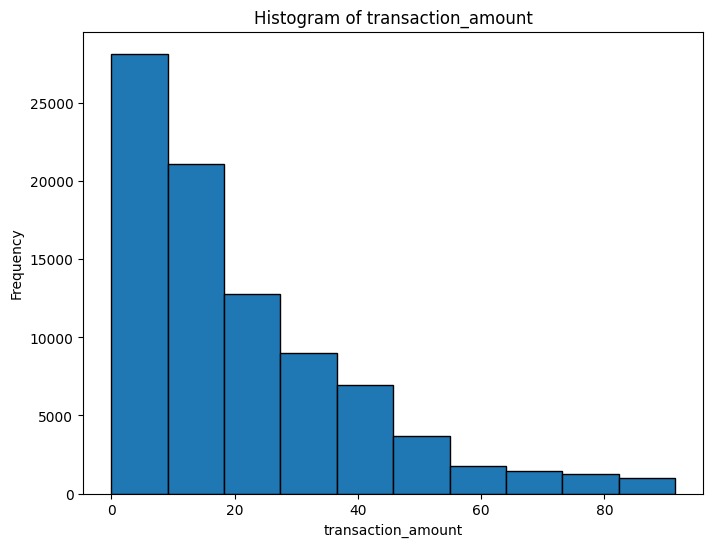

In [45]:
import pandas as pd
import matplotlib.pyplot as plt

def generate_histograms(data, numerical_columns):
    for column in numerical_columns:
        column_data = data[column]
        
        plt.figure(figsize=(8, 6))
        plt.hist(column_data, bins=10, edgecolor='black')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.title(f'Histogram of {column}')
        plt.show()

# Read the dataset
data = data_no_outliers_iqr

# Specify the numerical column names
numerical_columns = ['transaction_amount']

# Call the function
generate_histograms(data, numerical_columns)


In [46]:
import pandas as pd
import plotly.graph_objects as go

def generate_histograms(data, numerical_columns, categorical_column=None):
    if categorical_column is None:
        # Generate histograms for numerical columns
        for column in numerical_columns:
            fig = go.Figure()

            fig.add_trace(go.Histogram(x=data[column], nbinsx=10))

            fig.update_layout(
                title=f"Histogram of {column}",
                xaxis_title=column,
                yaxis_title="Frequency"
            )

            fig.show()
    else:
        # Generate histograms for transaction_amount based on categorical_column
        categories = data[categorical_column].unique()

        for category in categories:
            filtered_data = data[data[categorical_column] == category]

            fig = go.Figure()

            fig.add_trace(go.Histogram(x=filtered_data["transaction_amount"], nbinsx=20))

            fig.update_layout(
                title=f"Histogram of transaction_amount for {categorical_column} = {category}",
                xaxis_title="transaction_amount",
                yaxis_title="Frequency"
            )

            fig.show()

# Read the dataset
data = data_no_outliers_iqr

# Specify the numerical column names
numerical_columns = ['transaction_amount']

# Specify the categorical column name
categorical_column = 'merchant_category'

# Call the function to generate histograms
generate_histograms(data, numerical_columns)

# Call the function to generate transaction_amount histograms for different merchant_category values
generate_histograms(data, numerical_columns, categorical_column)


In [47]:
import pandas as pd
import plotly.graph_objects as go

def generate_boxplots(data, numerical_column, categorical_columns):
    for category in categorical_columns:
        fig = go.Figure()

        for value in data[category].unique():
            fig.add_trace(go.Box(
                x=data[data[category] == value][numerical_column],
                name=str(value)
            ))

        fig.update_layout(
            title=f"Box Plot of {numerical_column} by {category}",
            xaxis_title=category,
            yaxis_title=numerical_column
        )

        fig.show()

# Read the dataset
data = data_no_outliers_iqr

# Specify the numerical column name
numerical_column = 'transaction_amount'

# Specify the categorical column names
categorical_columns = ['card_type']

# Call the function to generate box plots
generate_boxplots(data, numerical_column, categorical_columns)


In [48]:
import pandas as pd
import plotly.express as px

def generate_grouped_time_series(data, numerical_column, categorical_columns):
    # Convert 'transaction_date' column to datetime
    data['transaction_date'] = pd.to_datetime(data['transaction_date'])
    
    # Extract month-year from 'transaction_date'
    data['month'] = data['transaction_date'].dt.month
    data['year'] = data['transaction_date'].dt.year
    data['month'] = data['month'].astype(str)
    data['year'] = data['year'].astype(str)
    data['month_year']  = data['month'] +"-"+ data['year']
    data['month_year'] = pd.to_datetime(data['month_year'])
    # Group by 'month_year' and sum the numerical column
   
    
    for category in categorical_columns:
        grouped_data = data.groupby(['month_year'] + categorical_columns)[numerical_column].sum().reset_index()
        fig = px.line(data_frame=grouped_data, x='month_year', y=numerical_column, color=category,
                      title=f"Grouped Time Series Plot of {numerical_column} by {category}")

        fig.update_layout(
            xaxis_title="Month-Year",
            yaxis_title=f"Sum of {numerical_column}"
        )

        fig.show()

# Read the dataset
data = data_no_outliers_iqr

# Specify the numerical column name
numerical_column = 'transaction_amount'

# Specify the categorical column names
categorical_columns = ['merchant_category']

# Call the function to generate grouped time series line plots
generate_grouped_time_series(data, numerical_column, categorical_columns)

